In [3]:
# 1. Imports and basic configuration
import os
from pathlib import Path

import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

from cytof_label_transfer import load_anndata, split_timepoints, train_classifier
from cytof_label_transfer.data_utils import extract_xy, extract_x_target
from cytof_label_transfer.model import TrainedModelBundle, predict_timepoint, train_classifier_fixed_params
from cytof_label_transfer.qc import evaluate_and_plot_cv

%matplotlib inline
sns.set(context='notebook', style='whitegrid')

print('Working directory:', os.getcwd())

Working directory: /home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer


In [1]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300


In [4]:
# 2. Define paths and key parameters
# TODO: EDIT THESE VALUES TO MATCH YOUR DATA
input_h5ad = Path('/home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer/dataset/roi_1_4_and_5_scanvi.h5ad')  # <-- change this
time_col = 'ROI_round_id'                     # .obs column with timepoints
label_col = 'Clust_all'                     # .obs column with trusted labels (tp1-4)
train_timepoints = [1.0, 2.0, 3.0, 4.0]            # training timepoints
target_timepoint = 5.0                       # target timepoint for prediction

# Optional: use a specific AnnData layer instead of .X (set to None to use .X)
use_layer = None

# Optional: append latent space from .obsm (e.g. scVI)
use_obsm_key = 'X_scVI_200_epoch'  # set to None if you do not want to use latent features

# Optional: use GPU-accelerated XGBoost if available
use_gpu = True  # set to False to force CPU

# Output locations
output_model_dir = Path('results/model_tp1_4')
output_model_dir.mkdir(parents=True, exist_ok=True)
output_h5ad = Path('results/data_with_predictions.h5ad')  # where to save updated AnnData

print('Input h5ad:', input_h5ad)
print('Model output dir:', output_model_dir)
print('Output h5ad:', output_h5ad)
print('Using obsm key:', use_obsm_key)
print('Using GPU:', use_gpu)

Input h5ad: /home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer/dataset/roi_1_4_and_5_scanvi.h5ad
Model output dir: results/model_tp1_4
Output h5ad: results/data_with_predictions.h5ad
Using obsm key: X_scVI_200_epoch
Using GPU: True


In [5]:
# 3. Load AnnData and inspect timepoints
adata = load_anndata(str(input_h5ad))
print(adata)

# Show timepoint distribution
print('Timepoint value counts:')
display(adata.obs[time_col].value_counts().sort_index())

# Quick peek at label distribution (may be noisy for tp5)
print('Label distribution (overall):')
display(adata.obs[label_col].value_counts().head(20))

AnnData object with n_obs × n_vars = 1195602 × 52
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'sample_id', 'ObjectNumber', 'area', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'width_px', 'height_px', 'ROI', 'ROI_round_id', 'ROI_numb', 'patient_id', 'patient_id_numb', 'timepoint', 'timepoint_numb', 'group', 'group_numb', 'time_group', 'time_group_numb', 'disease', 'disease_numb', 'size.filter', 'names', 'UMAP_1_before', 'UMAP_2_before', 'UMAP_1_after', 'UMAP_2_after', 'Clust_all', 'Gate_immune', 'aggregatedNeighbors.CD23._Bcl6._B_cell', 'aggregatedNeighbors.CD4._activated', 'aggregatedNeighbors.CD4._naive', 'aggregatedNeighbors.CD8._activated', 'aggregatedNeighbors.CD8._naive', 'aggregatedNeighbors.cDC', 'aggregatedNeighbors.Discard_cell', 'aggregatedNeighbors.Endothelial', 'aggregatedNeighbors.FDCs', 'aggregatedNeighbors.GC_B_cell', 'aggregatedNeighbors.HLADR._B_cell', 'aggregatedNeighbors.Macro_CD11c._HLADR.', 'aggregatedNeighbors.Macro_CD11c._HL

ROI_round_id
1.0    214323
2.0    109632
3.0    138680
4.0    230702
5.0    502265
Name: count, dtype: int64

Label distribution (overall):


Clust_all
Stroma                354532
CD4+_activated        176978
CD8+_naive            146498
Macrophages           100507
Memory_B               68821
cDC                    57686
Monocytes              55696
Endothelial            43541
CD4+_naive             39019
HLADR+_B_cell          34416
T_regs                 23043
Monocytes_HLADR-       20998
Naive_B_cell           19768
Plasma_cell            18481
CD8+_activated         11704
FDCs                   11021
CD23+_Bcl6-_B_cell      6318
GC_B_cell               3352
Neutrophiles            2407
Tfh                      816
Name: count, dtype: int64

In [6]:
# 4. Split into training (tp1-4) and target (tp5) subsets
def _cast_timepoint(x):
    try:
        return float(x)
    except ValueError:
        return x

train_timepoints_cast = [_cast_timepoint(tp) for tp in train_timepoints]
target_timepoint_cast = _cast_timepoint(target_timepoint)

adata_train, adata_target = split_timepoints(
    adata,
    time_col=time_col,
    train_timepoints=train_timepoints_cast,
    target_timepoint=target_timepoint_cast,
)

print('Training cells (tp1-4):', adata_train.n_obs)
print('Target cells (tp5):', adata_target.n_obs)

# Check label distribution in training set only
print('Training label distribution:')
display(adata_train.obs[label_col].value_counts().head(30))

Training cells (tp1-4): 693337
Target cells (tp5): 502265
Training label distribution:


Clust_all
Stroma                239203
CD4+_activated         73153
Macrophages            60649
CD8+_naive             59499
Monocytes              38269
CD4+_naive             34233
Endothelial            31697
cDC                    28955
HLADR+_B_cell          28480
Naive_B_cell           18510
T_regs                 16010
Monocytes_HLADR-       14570
Memory_B               14152
CD8+_activated         10756
Plasma_cell            10517
CD23+_Bcl6-_B_cell      5831
FDCs                    3525
GC_B_cell               2741
Neutrophiles            1792
Tfh                      795
Name: count, dtype: int64

In [7]:
adata_target.obs["disease"].value_counts()

disease
Healthy    424915
SSC         59040
SLE         18310
Name: count, dtype: int64

In [8]:
adata_target_h = adata_target[adata_target.obs["disease"] == "Healthy"]
adata_target_d = adata_target[adata_target.obs["disease"] != "Healthy"]

In [9]:
# 5. Extract features and labels for training
# Define markers to exclude from the expression features
exclude_markers = ['80ArAr', '127I', '131Xe', '134Xe', '138Ba', '139La', 'IgM', '190BCKG', 'DNA1', 'DNA2', 'ICSK1', 'ICSK2', 'ICSK3', '208Pb', 'aSMA']

# Build a boolean mask over variables (True = keep)
feature_mask = ~adata_train.var_names.isin(exclude_markers)

X_train, y_train, feature_names = extract_xy(
    adata_train,
    label_col=label_col,
    use_layer=use_layer,
    feature_mask=feature_mask,
    use_obsm_key=use_obsm_key,
    )

X_train = np.asarray(X_train)
print('X_train shape:', X_train.shape)
print('y_train shape:', y_train.shape)
print('Number of features:', len(feature_names))
print('Example features:', feature_names)

X_train shape: (693337, 47)
y_train shape: (693337,)
Number of features: 47
Example features: ['Collagen-I', 'IgD', 'CD20', 'CD38', 'CD19', 'CD68', 'Tbet', 'CD31', 'Bcl6', 'IgG', 'HLA-DR', 'CD11b', 'CD14', 'CD45', 'CD15', 'CD11c', 'CD123', 'CD138', 'CD161', 'CXCR5', 'Podoplanin', 'RANKL', 'LYVE1', 'GATA3', 'CD23', 'PD-1', 'CD45RA', 'CD8a', 'CD127', 'CD4', 'CD3', 'CD27', 'CD21', 'CD45RO', 'CD24', 'Foxp3', 'Histone3', 'X_scVI_200_epoch_0', 'X_scVI_200_epoch_1', 'X_scVI_200_epoch_2', 'X_scVI_200_epoch_3', 'X_scVI_200_epoch_4', 'X_scVI_200_epoch_5', 'X_scVI_200_epoch_6', 'X_scVI_200_epoch_7', 'X_scVI_200_epoch_8', 'X_scVI_200_epoch_9']


/home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer/cytof_label_transfer/data_utils.py:94: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if obsm_key not in adata.obsm_keys():


In [ ]:
# 6. Train classifier with hyperparameter search
## Option A: full hyperparameter search (slower but explores params)
bundle = train_classifier(
    X_train,
    y_train,
    feature_names=feature_names,
    n_splits=5,
    n_iter=30,
    output_dir=output_model_dir,
    use_gpu=use_gpu,
    )

print('Training with hyperparameter search done.')
print('Train F1 (macro) stored in training_metrics.json')

/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [11:25:43] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


[Hyperparam search] Iteration 1/30 (  3.3%) - mean CV f1_macro=0.7582 ± 0.0016
[Hyperparam search] Iteration 2/30 (  6.7%) - mean CV f1_macro=0.8305 ± 0.0024
[Hyperparam search] Iteration 3/30 ( 10.0%) - mean CV f1_macro=0.8467 ± 0.0013
[Hyperparam search] Iteration 4/30 ( 13.3%) - mean CV f1_macro=0.8588 ± 0.0008
[Hyperparam search] Iteration 5/30 ( 16.7%) - mean CV f1_macro=0.8276 ± 0.0007
[Hyperparam search] Iteration 6/30 ( 20.0%) - mean CV f1_macro=0.8519 ± 0.0013
[Hyperparam search] Iteration 7/30 ( 23.3%) - mean CV f1_macro=0.8200 ± 0.0015
[Hyperparam search] Iteration 8/30 ( 26.7%) - mean CV f1_macro=0.8732 ± 0.0013
[Hyperparam search] Iteration 9/30 ( 30.0%) - mean CV f1_macro=0.8311 ± 0.0019
[Hyperparam search] Iteration 10/30 ( 33.3%) - mean CV f1_macro=0.8605 ± 0.0013
[Hyperparam search] Iteration 11/30 ( 36.7%) - mean CV f1_macro=0.8469 ± 0.0007
[Hyperparam search] Iteration 12/30 ( 40.0%) - mean CV f1_macro=0.8487 ± 0.0010
[Hyperparam search] Iteration 13/30 ( 43.3%) - me

In [13]:
# Load and print the macro F1 score from training_metrics.json
metrics_path = output_model_dir / 'training_metrics.json'
if metrics_path.exists():
    with metrics_path.open() as f:
        metrics = json.load(f)
    train_f1 = metrics.get('train_f1_macro')
    if train_f1 is not None:
        print(f'Train macro F1: {train_f1:.4f}')
    else:
        print('Train macro F1 not found in training_metrics.json')
else:
    print('training_metrics.json not found at', metrics_path)

Train macro F1: 1.0000


In [ ]:
# 6. Train classifier with hyperparameter search
## Option A: full hyperparameter search (slower but explores params)
bundle = train_classifier(
    X_train,
    y_train,
    feature_names=feature_names,
    n_splits=5,
    n_iter=30,
    output_dir=output_model_dir,
    use_gpu=use_gpu,
    )

print('Training with hyperparameter search done.')
print('Train F1 (macro) stored in training_metrics.json')

/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:27:28] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


Training (fixed params) done.
Train F1 (macro) stored in training_metrics.json
Best parameters used:
  subsample: 1.0
  reg_lambda: 1.0
  reg_alpha: 1.0
  n_estimators: 800
  min_child_weight: 1
  max_depth: 9
  learning_rate: 0.1
  gamma: 0.0
  colsample_bytree: 0.6


/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:54:53] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:54:53] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
-

Macro F1 and summary saved to: results/model_tp1_4/qc


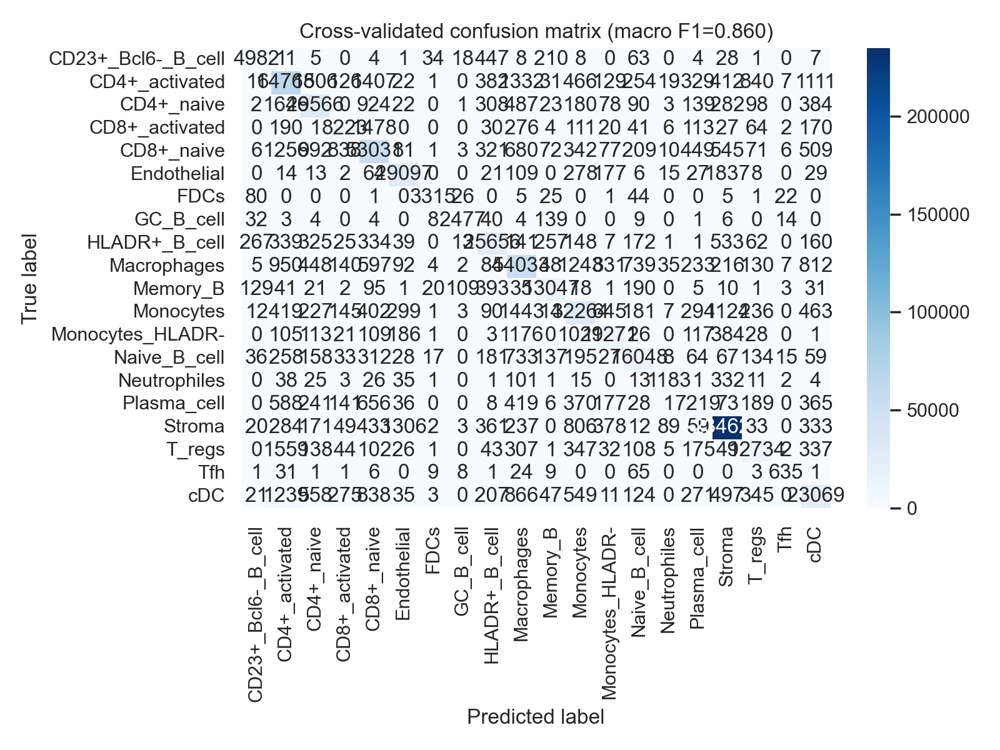

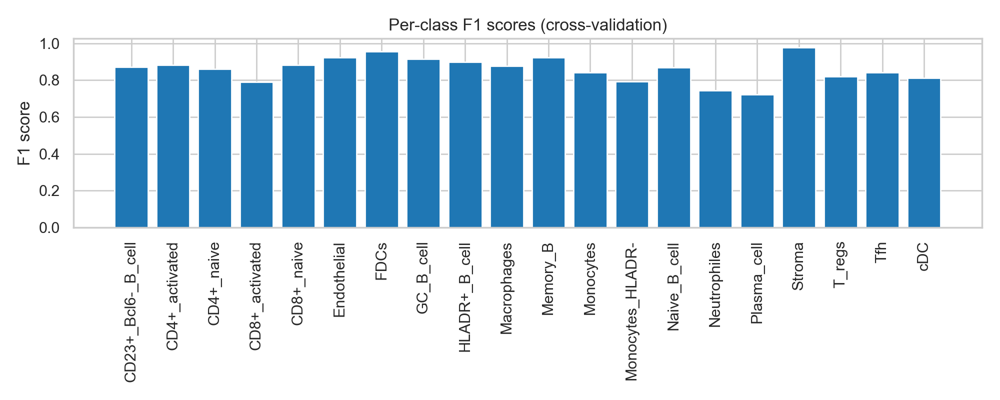

In [11]:
# 7. QC metrics and plots using cross-validation
qc_dir = output_model_dir / 'qc'
qc_dir.mkdir(parents=True, exist_ok=True)

evaluate_and_plot_cv(
    estimator=bundle.estimator,
    X=X_train,
    y=y_train,
    class_names=bundle.label_names,
    output_dir=qc_dir,
    label_encoder=bundle.label_encoder,
)

from IPython.display import Image, display

print('Macro F1 and summary saved to:', qc_dir)

# The QC helper saves plots with fixed filenames:
cm_path = qc_dir / 'cv_confusion_matrix.png'
f1_path = qc_dir / 'cv_per_class_f1.png'

if cm_path.exists():
    display(Image(filename=str(cm_path)))
if f1_path.exists():
    display(Image(filename=str(f1_path)))

In [12]:
# 8. Prepare features for target timepoint (tp5) and run prediction
if adata_target_d.n_obs == 0:
    raise ValueError('No cells found for the specified target timepoint.')

# Use the same marker exclusion for the target subset
feature_mask_target = ~adata_target_d.var_names.isin(exclude_markers)
# Recreate the same feature matrix (expression ± latent) as during training
X_target, feature_names_target = extract_x_target(
    adata_target_d,
    use_layer=use_layer,
    feature_mask=feature_mask_target,
    use_obsm_key=use_obsm_key,
    )

# Sanity check: ensure feature ordering matches training
if list(feature_names_target) != list(bundle.feature_names):
    raise ValueError('Feature names/order in target data do not match those used during training. Ensure you are using the same layer and obsm key.')

y_pred, y_proba = predict_timepoint(bundle, X_target)
print('Predicted labels for target cells:', len(y_pred))

# Attach predictions to the full AnnData object
pred_col = 'celltype_predicted'
conf_col = 'prediction_confidence'

adata.obs[pred_col] = pd.Series(index=adata.obs_names, dtype='object')
adata.obs.loc[adata_target_d.obs_names, pred_col] = y_pred

if y_proba is not None:
    max_conf = y_proba.max(axis=1)
    adata.obs[conf_col] = pd.Series(index=adata.obs_names, dtype='float')
    adata.obs.loc[adata_target_d.obs_names, conf_col] = max_conf

print('Prediction columns added to adata.obs:')
print('  ', pred_col)
print('  ', conf_col)

print('Predicted label distribution (tp5 only):')
display(adata.obs.loc[adata_target_d.obs_names, pred_col].value_counts().head(30))

/home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer/cytof_label_transfer/data_utils.py:94: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if obsm_key not in adata.obsm_keys():


Predicted labels for target cells: 77350
Prediction columns added to adata.obs:
   celltype_predicted
   prediction_confidence
Predicted label distribution (tp5 only):


celltype_predicted
Stroma                20909
Macrophages           12099
cDC                   11558
Monocytes             11545
Endothelial            5010
CD4+_activated         4787
Monocytes_HLADR-       3105
CD4+_naive             2201
CD8+_naive             1967
HLADR+_B_cell          1645
Naive_B_cell            559
FDCs                    481
CD23+_Bcl6-_B_cell      474
GC_B_cell               400
T_regs                  380
CD8+_activated          106
Tfh                      44
Plasma_cell              34
Memory_B                 24
Neutrophiles             22
Name: count, dtype: int64

In [15]:
import scanpy as sc

In [35]:
adata.raw = adata.copy()

In [36]:
sc.pp.scale(adata, max_value=10)

/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [13]:
roi_5_d = adata[(adata.obs["ROI_round_id"] == 5.0) & (adata.obs["disease"] != "Healthy")]

/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/anndata/_core/anndata.py:1190: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


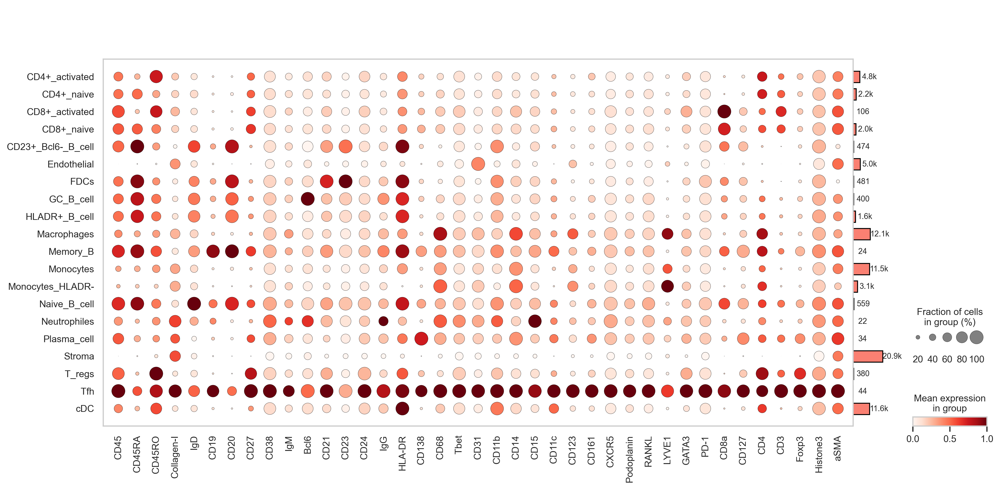

In [16]:
sc.pl.DotPlot(roi_5_d, var_names=['CD45', 'CD45RA', 'CD45RO', 'Collagen-I', 'IgD','CD19',
                                     'CD20', 'CD27', 'CD38',  'IgM', 'Bcl6', 'CD21', 'CD23','CD24',
       'IgG', 'HLA-DR', 'CD138', 'CD68', 'Tbet', 'CD31',  'CD11b', 'CD14',  'CD15', 'CD11c', 'CD123',
        'CD161', 'CXCR5', 'Podoplanin', 'RANKL', 'LYVE1', 'GATA3',
        'PD-1',  'CD8a', 'CD127', 'CD4', 'CD3',  
         'Foxp3', 'Histone3',  'aSMA'], groupby="celltype_predicted", standard_scale="var", use_raw=False).add_totals().show()

In [44]:
roi_5_d.obsm["X_umap"] = roi_5_d.obsm["X_UMAP_after"]

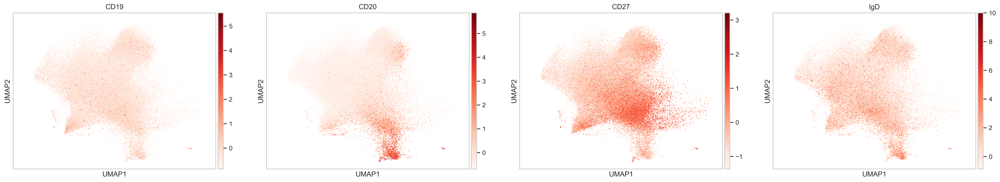

In [18]:
sc.pl.umap(roi_5_d, color=["CD19", "CD20","CD27", "IgD"], cmap="Reds", use_raw=False, size=5)

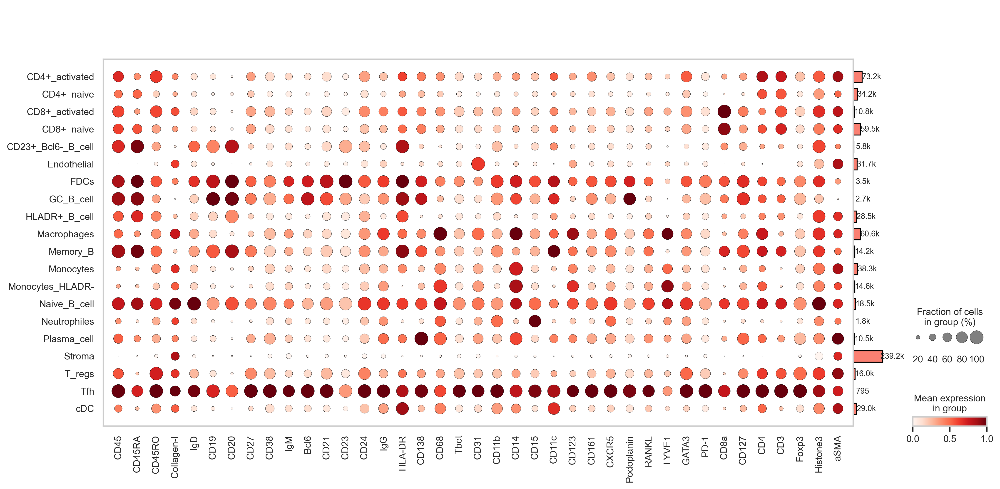

In [20]:
sc.pl.DotPlot(adata[adata.obs["ROI_round_id"].isin([1.0,2.0,3.0,4.0])], var_names=['CD45', 'CD45RA', 'CD45RO', 'Collagen-I', 'IgD','CD19',
                                     'CD20', 'CD27', 'CD38',  'IgM', 'Bcl6', 'CD21', 'CD23','CD24',
       'IgG', 'HLA-DR', 'CD138', 'CD68', 'Tbet', 'CD31',  'CD11b', 'CD14',  'CD15', 'CD11c', 'CD123',
        'CD161', 'CXCR5', 'Podoplanin', 'RANKL', 'LYVE1', 'GATA3',
        'PD-1',  'CD8a', 'CD127', 'CD4', 'CD3',  
         'Foxp3', 'Histone3',  'aSMA'], groupby="Clust_all", standard_scale="var", use_raw=False).add_totals().show()

In [21]:
# 8. Prepare features for target timepoint (tp5) and run prediction
if adata_target_h.n_obs == 0:
    raise ValueError('No cells found for the specified target timepoint.')

# Use the same marker exclusion for the target subset
feature_mask_target = ~adata_target_h.var_names.isin(exclude_markers)
# Recreate the same feature matrix (expression ± latent) as during training
X_target, feature_names_target = extract_x_target(
    adata_target_h,
    use_layer=use_layer,
    feature_mask=feature_mask_target,
    use_obsm_key=use_obsm_key,
    )

# Sanity check: ensure feature ordering matches training
if list(feature_names_target) != list(bundle.feature_names):
    raise ValueError('Feature names/order in target data do not match those used during training. Ensure you are using the same layer and obsm key.')

y_pred, y_proba = predict_timepoint(bundle, X_target)
print('Predicted labels for target cells:', len(y_pred))

# Attach predictions to the full AnnData object
pred_col = 'celltype_predicted'
conf_col = 'prediction_confidence'

adata.obs[pred_col] = pd.Series(index=adata.obs_names, dtype='object')
adata.obs.loc[adata_target_h.obs_names, pred_col] = y_pred

if y_proba is not None:
    max_conf = y_proba.max(axis=1)
    adata.obs[conf_col] = pd.Series(index=adata.obs_names, dtype='float')
    adata.obs.loc[adata_target_h.obs_names, conf_col] = max_conf

print('Prediction columns added to adata.obs:')
print('  ', pred_col)
print('  ', conf_col)

print('Predicted label distribution (tp5 only):')
display(adata.obs.loc[adata_target_h.obs_names, pred_col].value_counts().head(30))

/home/md-adnan-karim/Documents/git_repo/cytofLabelTransfer/cytof_label_transfer/data_utils.py:94: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if obsm_key not in adata.obsm_keys():


Predicted labels for target cells: 424915
Prediction columns added to adata.obs:
   celltype_predicted
   prediction_confidence
Predicted label distribution (tp5 only):


celltype_predicted
CD8+_naive            135372
CD4+_naive             66434
HLADR+_B_cell          52040
Memory_B               45697
Stroma                 42152
CD4+_activated         26184
CD23+_Bcl6-_B_cell     12806
Macrophages            10432
cDC                     7199
Monocytes               6858
CD8+_activated          4906
Monocytes_HLADR-        4358
FDCs                    3506
GC_B_cell               2977
Endothelial             1686
Naive_B_cell             797
Plasma_cell              562
T_regs                   495
Neutrophiles             406
Tfh                       48
Name: count, dtype: int64

In [22]:
roi_5_h = adata[(adata.obs["ROI_round_id"] == 5.0) & (adata.obs["disease"] == "Healthy")]

In [56]:
roi_5_h.obsm["X_umap"] = roi_5_h.obsm["X_UMAP_after"]

/home/md-adnan-karim/miniconda3/envs/cytof-label-transfer/lib/python3.11/site-packages/anndata/_core/anndata.py:1190: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


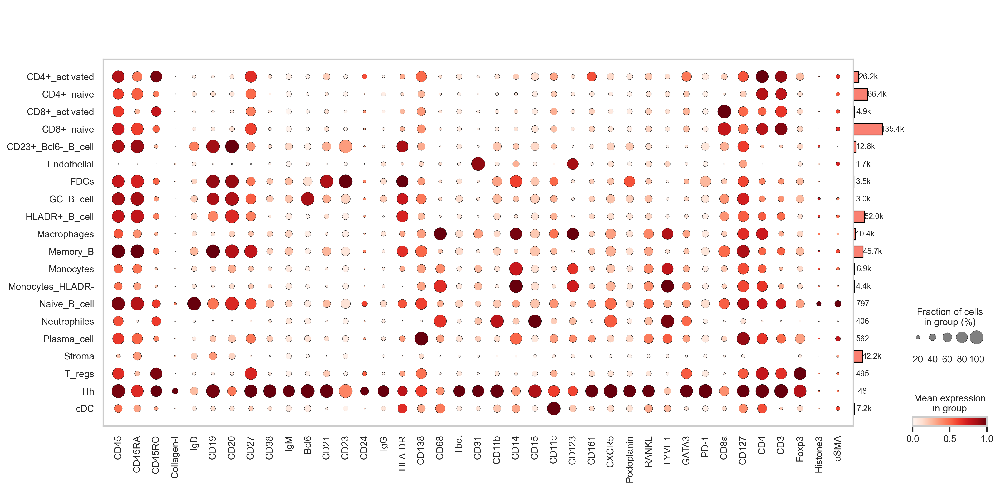

In [23]:
sc.pl.DotPlot(roi_5_h, var_names=['CD45', 'CD45RA', 'CD45RO', 'Collagen-I', 'IgD','CD19',
                                     'CD20', 'CD27', 'CD38',  'IgM', 'Bcl6', 'CD21', 'CD23','CD24',
       'IgG', 'HLA-DR', 'CD138', 'CD68', 'Tbet', 'CD31',  'CD11b', 'CD14',  'CD15', 'CD11c', 'CD123',
        'CD161', 'CXCR5', 'Podoplanin', 'RANKL', 'LYVE1', 'GATA3',
        'PD-1',  'CD8a', 'CD127', 'CD4', 'CD3',  
         'Foxp3', 'Histone3',  'aSMA'], groupby="celltype_predicted", standard_scale="var", use_raw=False).add_totals().show()

In [67]:
adata.obsm["X_umap"] = adata.obsm["X_UMAP_after"]

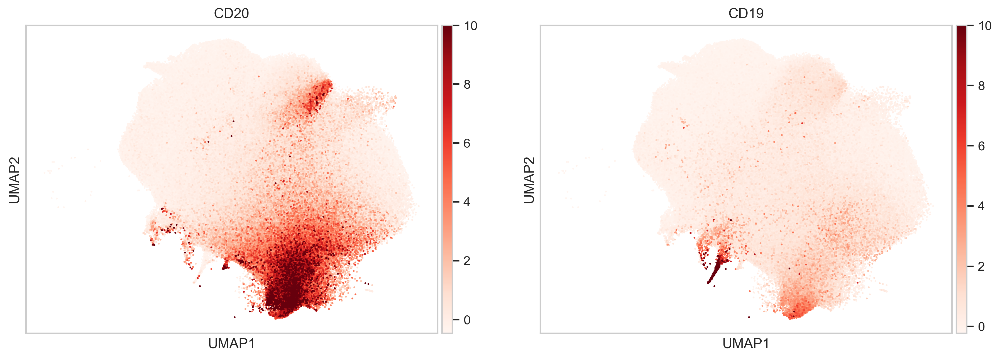

In [70]:
sc.pl.umap(adata[adata.obs["ROI_round_id"].isin([1.0,2.0,3.0,4.0])], color=["CD20", "CD19"], cmap="Reds", size=10, use_raw=False)

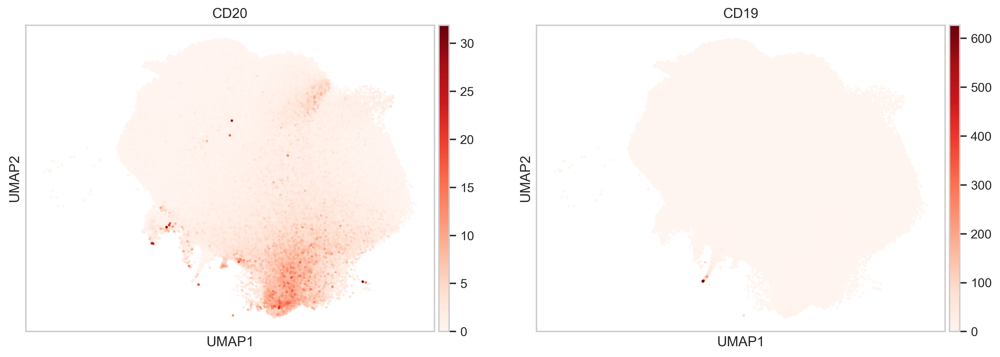

In [71]:
sc.pl.umap(adata[adata.obs["ROI_round_id"].isin([1.0,2.0,3.0,4.0])], color=["CD20", "CD19"], cmap="Reds", size=20, use_raw=True)